# Aquisição e Exploração dos dados

A partir de um dataset OpenSource (https://sites.google.com/view/utarldd/home) confeccionado especificamente com o objetivo de servir como base de treinamento para modelos de ML de classificação de fadiga, foram extraídos dados referentes ao valor de EAR (um índice de aebertura dos olhos) e distância entre os lábios com o auxílio da biblioteca de visão computacional OpenCV e dlib.

O dataset é composto de 182 vídeos de 60 voluntários diferentes. Cada um dos voluntários filmou três vídeos de aproximadamente 10 minutos cada, sendo cada um deles em um determinado estado de fadiga: Alerta, cansado ou muito cansado. O nome do vídeo informa o estado no qual ele foi filmado, sendo 0 alerta, 5 cansado e 10 muito cansado.

Neste documento, busca-se realizar uma exploração dos dados obtidos com o objetivo de verificar a integridade dos dados adiquiridos e verificar possíveis ajustes necessários (filtros, normalizações e etc.) para que os dados sirvam de entrada para um modelo de Machine Learning que irá prever o estado de fadiga de operadores em tempo real.

Os dados extraídos foram EAR (Eye Aspect Ratio) e Distância entre os lábios. Quando haviam falhas no sistema de aquisição destes dois parâmetros, atrubuiu-se o valor de -1.

*Imports*

In [44]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt

In [45]:
# arquivo de armazenamento dos dados extraídos: results_novo2.csv
df = pd.read_csv('results_novo2.csv', sep=';',usecols=[0,1,2])

In [46]:
df.head()

,ear,distancia_entre_os_labios,nome_video
0,0.291351,13.833333,55/0.mp4
1,0.296493,14.000000,55/0.mp4
2,0.316485,14.333333,55/0.mp4
3,0.321407,15.333333,55/0.mp4
4,0.290985,15.000000,55/0.mp4


In [47]:
df.info

<bound method DataFrame.info of               ear  distancia_entre_os_labios nome_video
0        0.291351                  13.833333   55/0.mp4
1        0.296493                  14.000000   55/0.mp4
2        0.316485                  14.333333   55/0.mp4
3        0.321407                  15.333333   55/0.mp4
4        0.290985                  15.000000   55/0.mp4
...           ...                        ...        ...
3084074  0.380242                   2.500000   54/5.mp4
3084075  0.393527                   1.666667   54/5.mp4
3084076  0.388569                   1.833333   54/5.mp4
3084077  0.400175                   0.833333   54/5.mp4
3084078  0.377410                   1.166667   54/5.mp4

[3084079 rows x 3 columns]>

### Os dados foram armazenados no CSV identificando o vídeo pela coluna "nome_vídeo"

In [48]:
videos = pd.unique(df.nome_video)
videos 

array(['55/0.mp4', '55/10.mp4', '55/5.mp4', '56/0.MOV', '56/10.MOV',
       '56/5.MOV', '57/0.MOV', '57/10.MOV', '57/5.MOV', '59/0.MOV',
       '59/10.MOV', '59/5.MOV', '60/0.mov', '60/10.mov', '60/5.mov',
       '01/0.mov', '01/10.MOV', '01/5.mov', '02/0.mov', '02/10.MOV',
       '02/5.MOV', '03/0.MOV', '03/10.mov', '03/5.mov', '04/0.mp4',
       '04/10.mp4', '04/5.mp4', '05/0.MOV', '05/10.MOV', '05/5.MOV',
       '06/0.mp4', '06/10.mp4', '06/5.mp4', '07/5.mp4', '09/0.mp4',
       '09/10.mp4', '09/5.mp4', '10/0.MOV', '10/10.MOV', '10/5.MOV',
       '11/0.mp4', '11/10.mp4', '11/5.mp4', '12/0.mp4', '12/10.mp4',
       '12/5.mp4', '14/10.mp4', '14/5.mp4', '15/0.mp4', '15/10.mp4',
       '15/5.mp4', '16/0.MOV', '16/10.MOV', '16/5.MOV', '17/0.mp4',
       '17/10.mp4', '17/5.mp4', '18/0.mov', '18/10.mov', '18/5.mov',
       '19/0.MOV', '19/10.MOV', '19/5.MOV', '20/0.mp4', '20/5.MOV',
       '21/0.MOV', '21/5.MOV', '22/0.MOV', '22/10.MOV', '22/5.MOV',
       '23/0.mp4', '23/10.mp4', '23/5.mp

### Análise vídeo a vídeo para identificar anomalias e vídeos inválidos, ou seja, com poucos dados relevantes. 

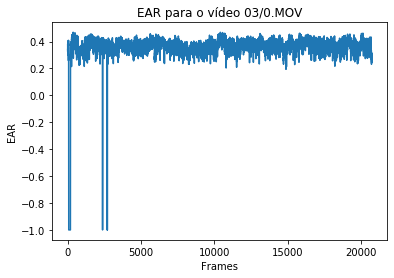

In [67]:
video_name = '03/0.MOV'

df_ear_filtered = df.query("nome_video == '"+video_name+"'")
plt.title('EAR para o vídeo ' + video_name)
plt.xlabel('Frames')
plt.ylabel('EAR')
plt.plot(range(len(df_ear_filtered['ear'])), df_ear_filtered['ear'])
plt.show()

In [90]:


fig = plt.figure(figsize=(62,800))

    
#plot all videos graphs
for count, video in enumerate(sorted(videos)):
    df_ear_filtered = df.query("nome_video == '"+video+"'")
    plt.subplot(62,3,count+1)
    plt.plot(range(len(df_ear_filtered['ear'])), df_ear_filtered['ear'])
    plt.title('EAR para o vídeo ' + video, size=40)
    plt.xlabel('Frames',  fontsize = 30.0)
    plt.ylabel('EAR',  fontsize = 30.0)
    plt.xticks( fontsize = 30)
    plt.yticks( fontsize = 30)

#     print(count)
plt.show()

In [ ]:
def video_relevante(df_filtrado, treshold):
    df_dados = df_filtrado.query("ear!=-1" and "distancia_entre_os_labios!=-1")

    print(treshold)
    if df_dados.shape[0]<treshold:
        return False
    else:
        return True

if video_relevante(df_ear_filtered, len(df_ear_filtered['ear'])*treshold_percentage):
        plt.plot(range(len(df_ear_filtered['ear'])), df_ear_filtered['ear'])
        plt.show()

# Análise dos dados

In [23]:
ear = df['ear']

In [24]:
import matplotlib.pyplot as plt
plt.plot(ear)

In [25]:
from scipy.ndimage.morphology import grey_opening, grey_closing

ear_opening = grey_opening(ear, 11)
ear_closing = grey_closing(ear, 11)

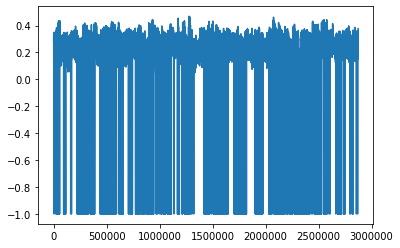

In [26]:
plt.plot(ear_opening)

In [27]:
from skimage.morphology import reconstruction
import numpy as np 

ear_rec = reconstruction(ear - 0.10, ear, selem = np.ones((11,)))

In [ ]:
plt.figure()
plt.plot(ear[2980:3050])
plt.plot(ear[2980:3050]- 0.10)
plt.show()

In [ ]:
plt.plot(ear_rec[2980:3050])